# KPrototypes(k=24) Results

From the previous notebook, we have identified that `k=4` is the optimum number of clusters.  
However, will KPrototypes make greater use of categorical features if we increase the number of clusters?

We will only be performing surface level analysis in this notebook without going deep into the individual differences between clusters.

**Setting up**

In [1]:
%load_ext kedro.ipython
%load_ext autoreload
%matplotlib inline
%autoreload 2

[04/20/23 21:14:04] INFO     Resolved project path as: /home/eckt/Documents/usg.                    ]8;id=789919;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=264770;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py#134\134]8;;\
                             To set a different path, run '%reload_kedro <project_root>'                           

[04/20/23 21:14:07] INFO     Kedro project usg                                                      ]8;id=42465;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=646088;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py#103\103]8;;\

                    INFO     Defined global variable 'context', 'session', 'catalog' and            ]8;id=491822;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=578869;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py#104\104]8;;\
                             'pipelines'                                                                           

[04/20/23 21:14:09] INFO     Registered line magic 'run_viz'                                        ]8;id=819869;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py\__init__.py]8;;\:]8;id=502423;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/ipython/__init__.py#110\110]8;;\

In [2]:
import pandas as pd
import polars as pl
import numpy as np

from matplotlib import rc_context
import matplotlib.pyplot as plt
import seaborn as sb
from seaborn.objects import Plot
import seaborn.objects as so

from kmodes.kprototypes import KPrototypes
from sklearn.preprocessing import PowerTransformer, StandardScaler
from sklearn.decomposition import PCA

import logging

from usg.utils import *

log = logging.getLogger(__name__)
log.setLevel(logging.INFO)
sb.set()

In [3]:
k = 24
kaggle_steam: pd.DataFrame = catalog.load('kaggle_steam').set_index('appid')
X: pd.DataFrame = catalog.load('train').set_index('appid')
sscaler: StandardScaler = catalog.load('model@sscaler')
pscaler: PowerTransformer = catalog.load('model@pscaler')
pca: PCA = catalog.load('model@pca')
model: KPrototypes = catalog.load(f'model@kprototypes@{k}')
clusters: pd.Series = catalog.load(f'labels@kprototypes@{k}')['cluster'].set_axis(X.index)

def unpca(X: pd.DataFrame):
    u = pd.DataFrame(pca.inverse_transform(X[pca.get_feature_names_out()]), columns=pca.feature_names_in_, index=X.index)
    return pd.concat([X.loc[:, categorical], u], axis=1)[columns]

def inverse_transform(X: pd.DataFrame):
    sdf = pd.DataFrame(sscaler.inverse_transform(X[sscaler.feature_names_in_]), columns=sscaler.feature_names_in_, index=X.index)
    pdf = pd.DataFrame(pscaler.inverse_transform(X[pscaler.feature_names_in_]), columns=pscaler.feature_names_in_, index=X.index)
    X = pd.concat([X.loc[:, categorical], sdf, pdf], axis=1)[columns]
    X['est_owners'] = 10 ** X['est_owners']
    return X

X = unpca(X)
kaggle_steam['cluster'] = X['cluster'] = clusters

[04/20/23 21:14:11] INFO     Loading data from 'kaggle_steam' (CSVDataSet)...                   ]8;id=699106;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=812070;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

[04/20/23 21:14:12] INFO     Loading data from 'train' (CSVDataSet)...                          ]8;id=258539;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=337718;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'model@sscaler' (PickleDataSet)...               ]8;id=205828;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=882790;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'model@pscaler' (PickleDataSet)...               ]8;id=271610;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=768524;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'model@pca' (PickleDataSet)...                   ]8;id=462431;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=732952;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'model@kprototypes@24' (PickleDataSet)...        ]8;id=649620;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=351202;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

                    INFO     Loading data from 'labels@kprototypes@24' (CSVDataSet)...          ]8;id=208564;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=227700;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

In [5]:
centroids_u = unpca(pd.DataFrame(model.cluster_centroids_, columns=list(pca.get_feature_names_out()) + categorical)) # KPrototypes handles categorical last
centroids = inverse_transform(centroids_u)

In [6]:
def melt_only(X: pd.DataFrame, columns: "list[str]"):
    pred = X['variable'].map(lambda x: x in columns)
    return X[pred]

counts = X['cluster'].value_counts()

viz = centroids_u.reset_index(names='cluster').melt(id_vars='cluster')
viz['categorical'] = viz['variable'].map(lambda x: x in categorical)
centroid_viz_data = (viz
                     .reset_index(names='order')
                     .set_index(['cluster', 'variable'])
                     .join(centroids
                           .reset_index(names='cluster')
                           .melt(id_vars='cluster', value_name='orig')
                           .set_index(['cluster', 'variable'])
                           .round(2)
                     )
                     .reset_index('cluster')
                     .join(X[columns].median()
                           .to_frame('median'),
                           how='left'
                     )
                     .reset_index(names='variable')
                     .set_index('cluster')
                     .sort_values(by='order'))

cluster_viz_data = X.melt(id_vars='cluster')#.set_index('cluster')
cluster_viz_data['categorical'] = cluster_viz_data['variable'].map(lambda x: x in categorical)
cluster_viz_data_numerical = cluster_viz_data[~cluster_viz_data['categorical']]
minmax = X[numerical].describe().loc[['min', '25%', '50%', '75%', 'max'], :].T.reset_index(names='variable').melt(id_vars='variable', var_name='indicators')

def centroid_viz(cluster=0):
    df = centroid_viz_data.loc[cluster].reset_index(drop=True)
    return (Plot(data=df, y="variable", x="value", color="categorical")
    .add(so.Bar(width=0.05, color="lightgrey", alpha=0.6), baseline="median", legend=False)
    .add(so.Dot())
    .add(so.Dot(fill=False), x="median", legend=False)
    .add(so.Text(halign="left", fontsize=8, offset=8, color="black"), text="orig")
    .label(title=f"Visualisation of cluster {cluster} centroid (n={counts[cluster]})")
    #.limit(x=(-0.05,1.2))
    )

def cluster_viz(cluster=0):
    fig, ax = plt.subplots(ncols=2, figsize=(12,6), sharex=True)
    fig.set_tight_layout(True)
    df = cluster_viz_data.set_index('cluster').loc[cluster].reset_index(drop=True)
    df2 = cluster_viz_data_numerical.set_index('cluster').loc[cluster].reset_index(drop=True)
    (sb.boxplot(data=df, 
                x='value', 
                y='variable', 
                ax=ax[0],
                fliersize=2,
                flierprops={"marker": "x"}, 
                showcaps=False)
    .set(title=f"Visualisation of cluster {cluster} (n={counts[cluster]})"))
    (sb.violinplot(data=df2,
                x='value', 
                y='variable', 
                ax=ax[1],
                hue=True,
                hue_order=[True,False],
                color='lightgrey',
                split=True,
                legend=False)
    .set(title=f"Numeric features"))
    (sb.scatterplot(data=minmax,
                    x='value',
                    y='variable',
                    hue='indicators',
                    marker='d',
                    ax=ax[1]))

## At a glance

**Number of games per cluster**

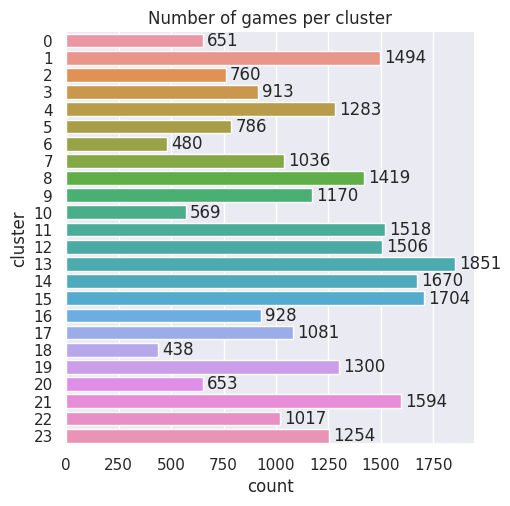

In [23]:
catplot_ylabel(sb.catplot(data=X, y='cluster', kind='count').set(title="Number of games per cluster"))

**Pairplot of PCA axes differentiated by assigned cluster**

Previously, at `k=4`, `pca2` and `pca4` were not very helpful. However, with `k=24`, they are able to make greater contributions. We note that some plots look quite similar to a heart shape, such as (7,3) and (8,0) (row,col).

[04/19/23 16:29:14] INFO     Loading data from 'train' (CSVDataSet)...                          ]8;id=231247;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=769277;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

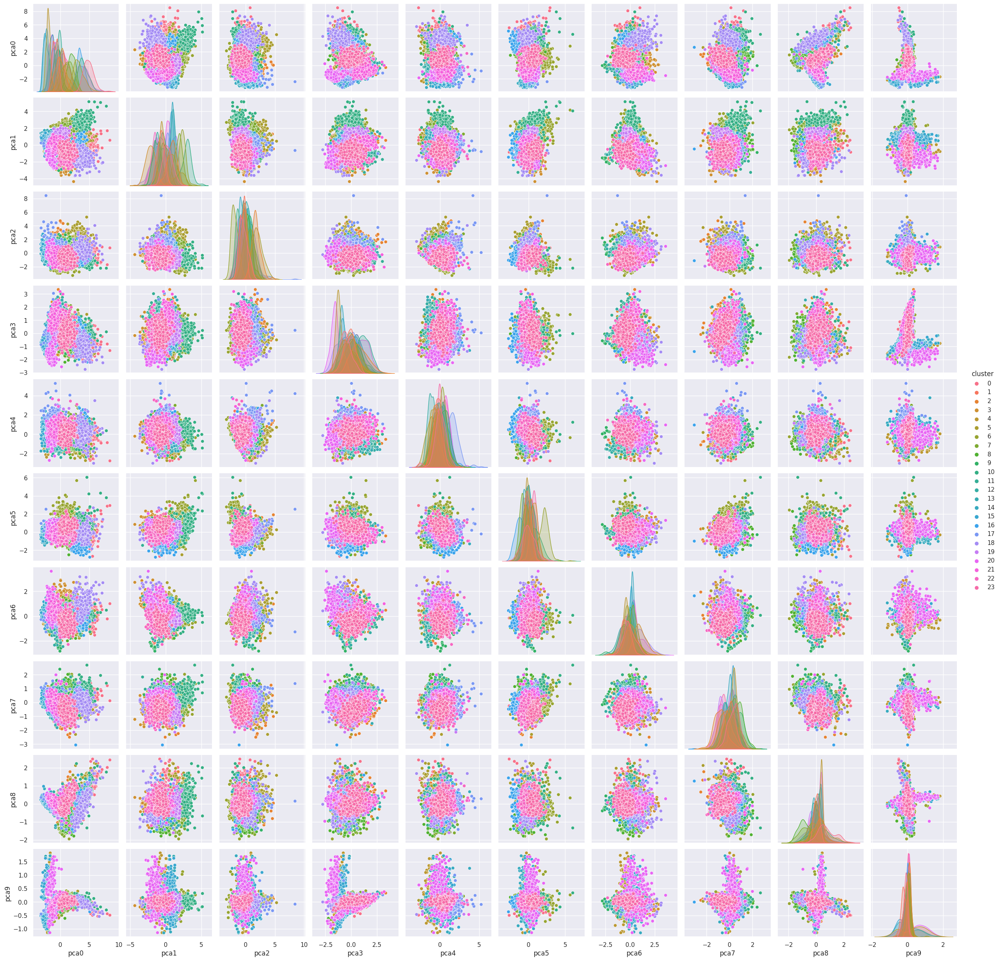

In [7]:
viz = catalog.load('train').set_index('appid')
viz['cluster'] = clusters
viz = viz.groupby(by='cluster').sample(200)[list(pca.get_feature_names_out()) + ['cluster']]
viz['cluster'] = viz['cluster'].map(str)
sb.pairplot(viz, hue='cluster')

## Centroids

**Categorical features**

We see greater use of categorical features, only `Strategy`, `kid_friendly` and `mature` remained unused. Probably due to their low prevalence.

**Numeric features**

We see that all features were utilised, with `achievements`, `est_owners` and `median_playtime` exhibiting high amount of clumping

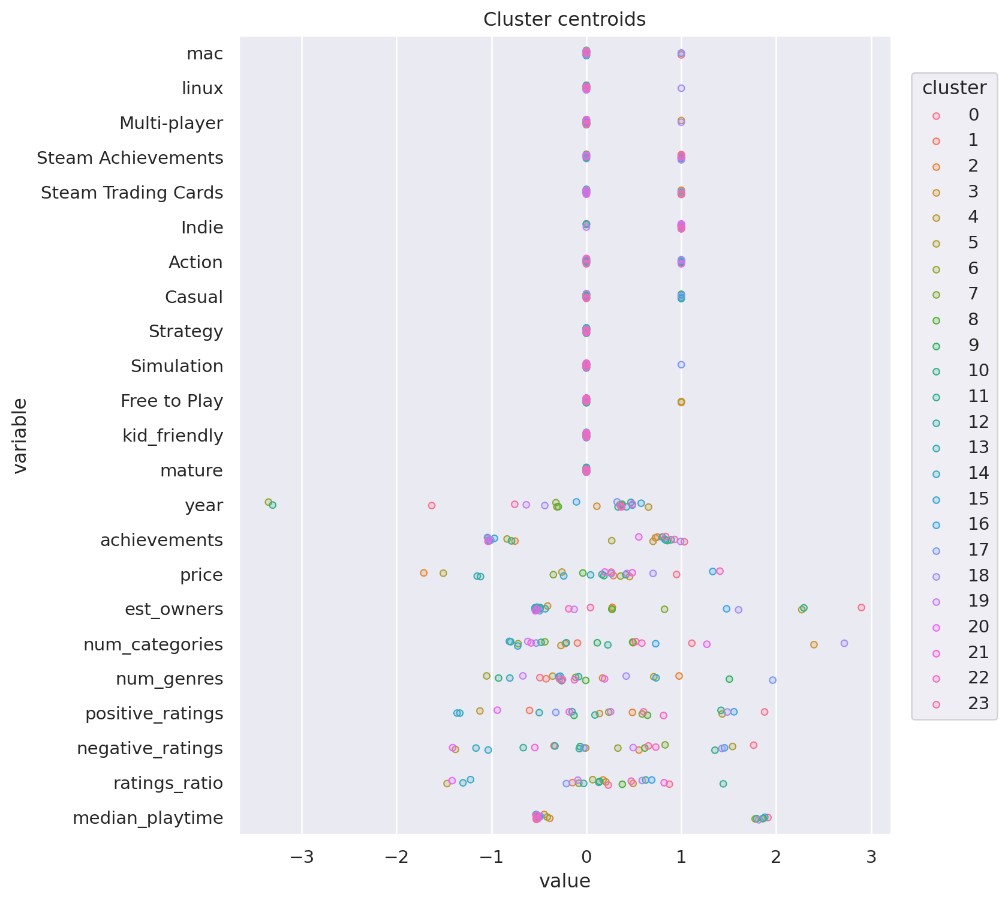

In [74]:
viz = centroid_viz_data.reset_index()
viz['cluster'] = viz['cluster'].map(str)
#viz['marker'] = viz['cluster'].map(lambda x: ('o' * 7 + 'x' * 7 + 'd' * 7 + '+' * 7)[x])
(Plot(data=viz, y="variable", x="value", color="cluster")
 #.limit(x=(-0.05,1.2))
 .layout(size=(8,8))
 .add(so.Dots(), so.Jitter(x=0))#, marker='marker', color='cluster')
 .label(title='Cluster centroids'))

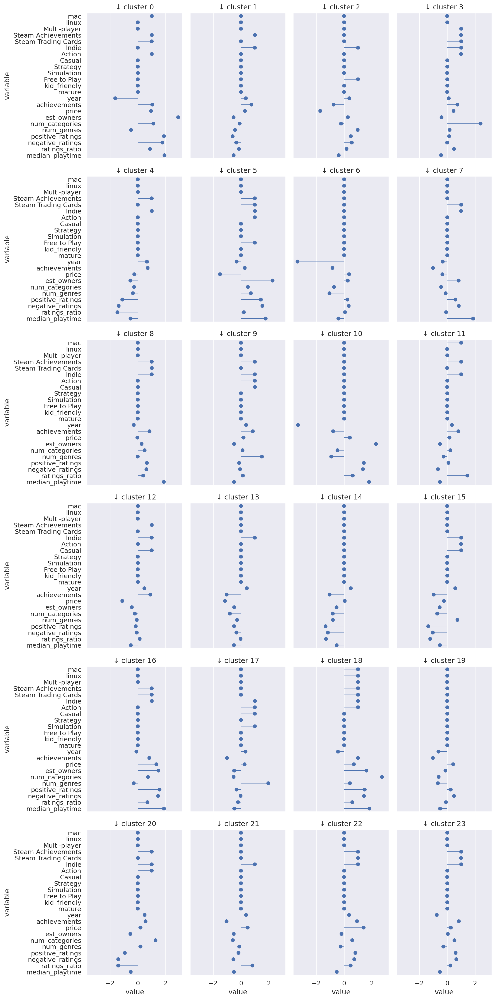

In [8]:
(Plot(data=centroid_viz_data.reset_index(), y="variable", x="value")
 #.limit(x=(-0.05,1.2))
 .layout(size=(12,24))
 .facet(col="cluster", wrap=4)
 .add(so.Bar(width=0.05))
 .add(so.Dot())
 .label(col="↓ cluster"))

[Text(0.5, 1.0, 'Heatmap of cluster centroids')]

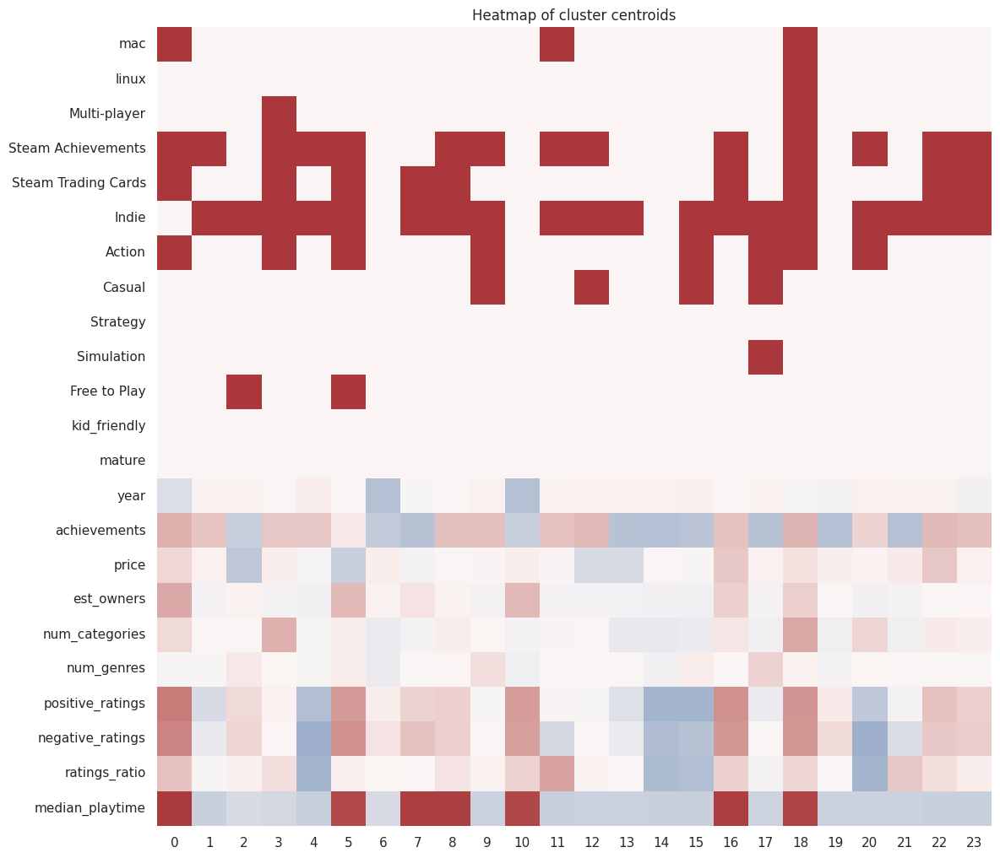

In [7]:
from sklearn.preprocessing import MaxAbsScaler
viz = MaxAbsScaler().set_output(transform="pandas").fit(X.drop(columns='cluster')).transform(centroids_u).T.round(2)
sb.heatmap(viz, square=True, center=0, cmap='vlag', ax=plt.figure(figsize=(12,12), layout='tight').gca(), cbar=False).set(title='Heatmap of cluster centroids')

# Cluster analysis

## Numeric Features

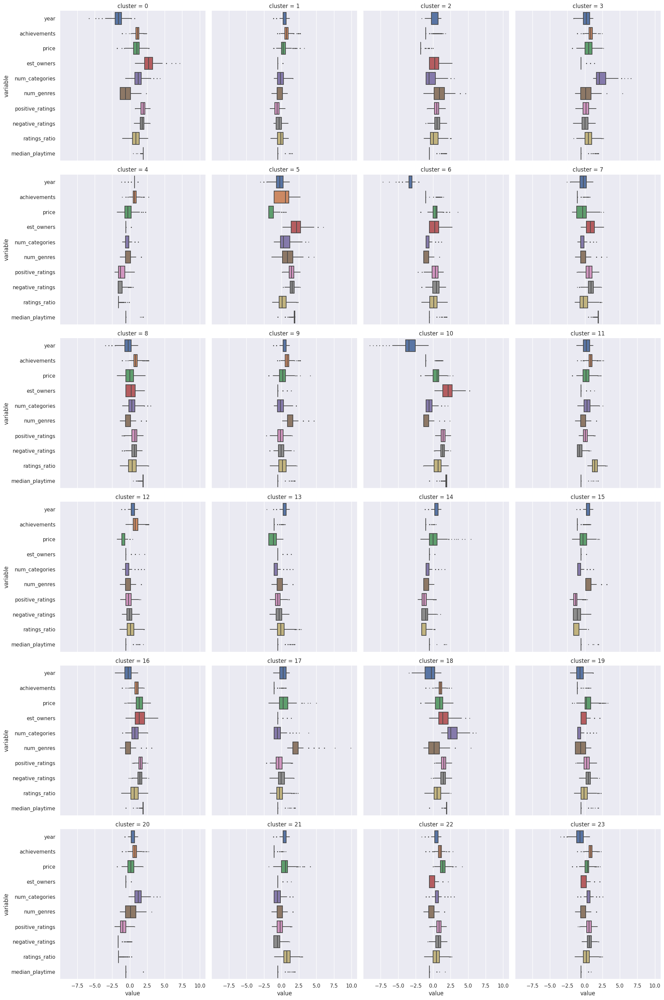

In [27]:
sb.catplot(data=melt_only(cluster_viz_data, numerical), 
           x='value', 
           y='variable', 
           col='cluster', 
           col_wrap=4,
           kind='box', 
           fliersize=2,
           flierprops={"marker": "+"}, 
           showcaps=False)

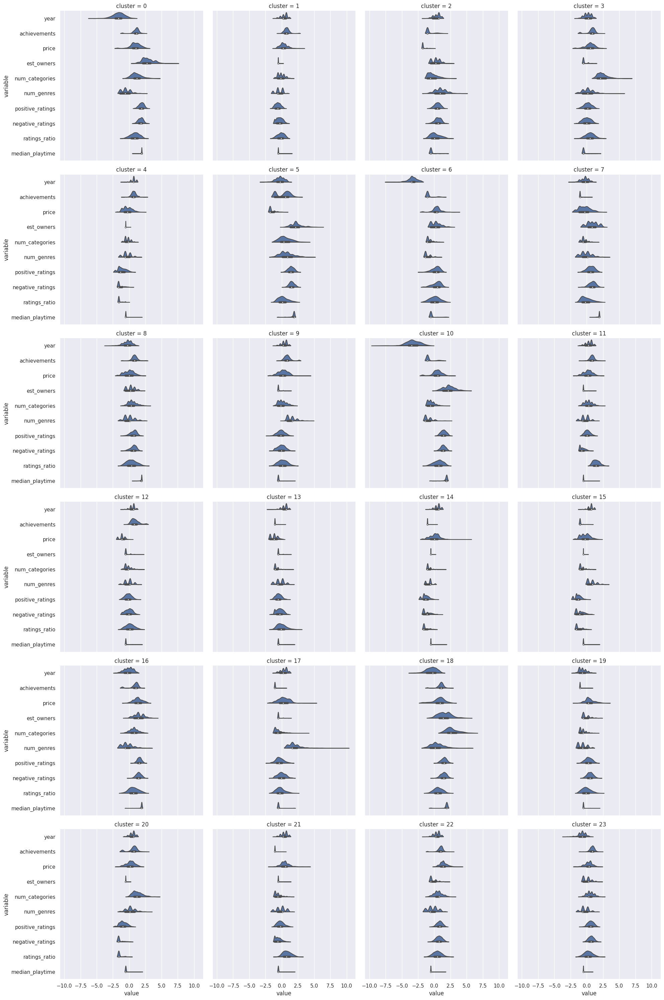

In [28]:
sb.catplot(data=melt_only(cluster_viz_data, numerical), 
           x='value', 
           y='variable', 
           col='cluster', 
           col_wrap=4,
           kind='violin',
           inner='box',
           hue=True,
           hue_order=[True, False],
           split=True,
           legend=False)

## Categorical features

We see that `Free to Play` has specific niche clusters like cluster 2 and cluster 5 while the other variables tend to be somewhat more evenly distributed.

*Note that the following graph does not account for the differences in the total size of each cluster. This is corrected in the second graph.*

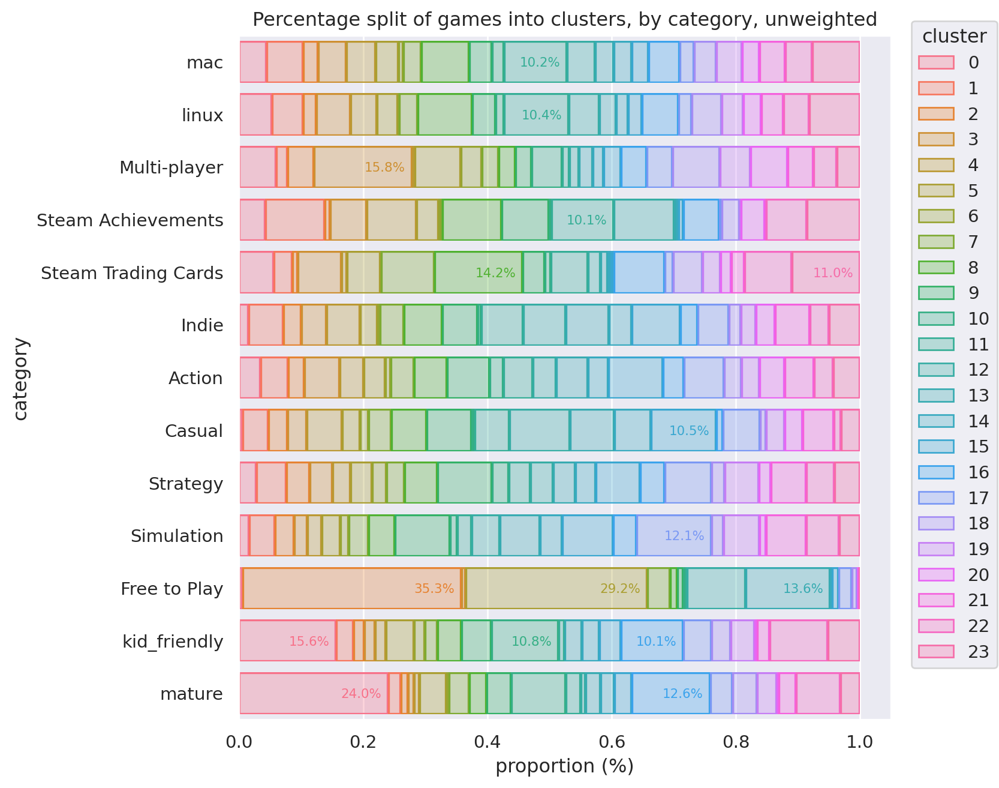

In [19]:
viz = (X.groupby(by='cluster')[categorical].sum() / X[categorical].sum()).T.reset_index(names='category').melt(id_vars='category', var_name='cluster', value_name='proportion (%)')
viz['cluster'] = viz['cluster'].map(str)
viz['text'] = viz['proportion (%)'].map(lambda x: f"{x:.1%}" if x >= 0.1 else "")
(Plot(data=viz, y='category', x='proportion (%)', color='cluster')
 .layout(size=(8,7))
 .add(so.Bar(alpha=.3), so.Stack())
 .add(so.Text(halign='right', fontsize=8), so.Stack(),text='text')
 .label(title='Percentage split of games into clusters, by category, unweighted'))

We see notable presences and absences in certain categories such as `Free to Play`, `Simulation` and `Steam Achievements`.

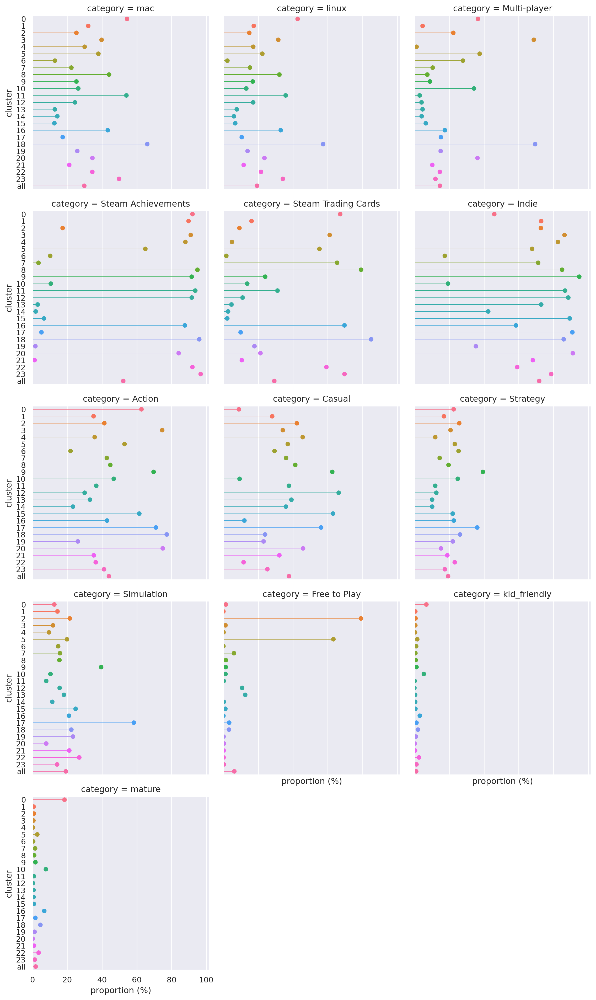

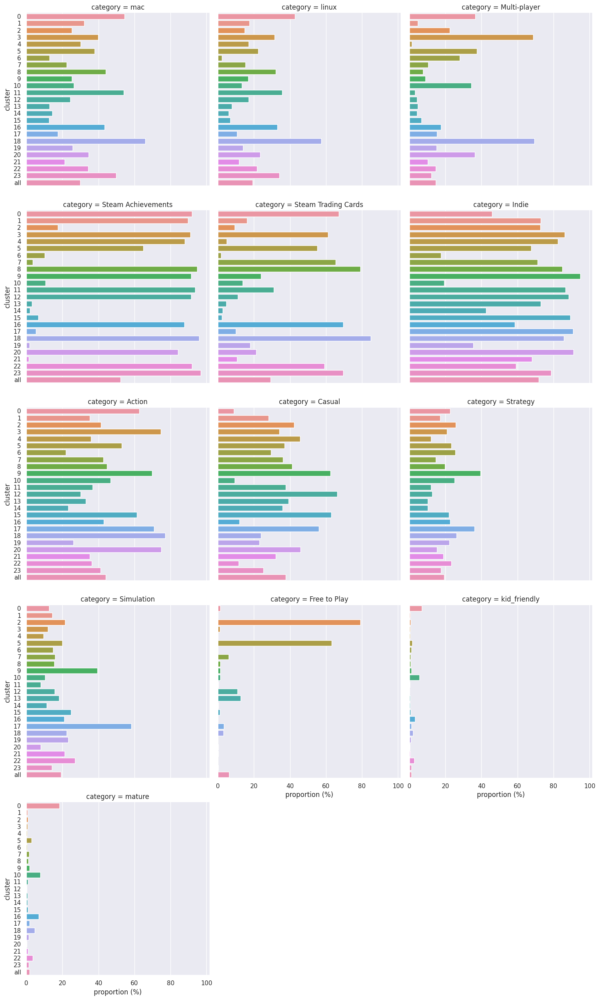

In [26]:
viz = (pd.concat([
    (X.groupby(by='cluster')[categorical].sum() / X.groupby(by='cluster')[categorical].count()).T,
    (X[categorical].sum() / X[categorical].count()).to_frame('all')
], axis=1).round(4) * 100).reset_index(names='category').melt(id_vars='category', var_name='cluster', value_name='proportion (%)')

with rc_context({'font.size': 6}):
    sb.catplot(data=viz, y='cluster', x='proportion (%)', kind='bar', col='category', col_wrap=3)

(Plot(data=viz, y="cluster", x="proportion (%)", color="cluster")
 .facet(col="category", wrap=3)
 #.limit(x=(-0.05,1.2))
 .layout(size=(12,20))
 .add(so.Bar(width=0.05), legend=False)
 .add(so.Dot(), legend=False)
 .label(col="category ="))

# Summary

We were quite pleased to see categorical variables playing a larger role when `k=24`, compared to having little effect when `k=4`.

# Appendix

## Treemap of steam games by number of owners and assigned clusters

**Interactive** (does not show in GitHub notebook preview)

In [5]:
import plotly.express as px
viz = kaggle_steam.copy().loc[:,['cluster', 'owners']]
viz['owners'] = viz['owners'].str.split('-')
viz['lo'] = viz['owners'].map(lambda x: shorten(int(x[0])))
viz['hi'] = viz['owners'].map(lambda x: shorten(int(x[1])))
viz['owners'] = viz['lo'] + '-' + viz['hi']
viz = viz.groupby(['owners', 'cluster']).count().iloc[:, 0].rename('count').reset_index()
viz['cluster'] = viz['cluster'].map(str)

fig = px.treemap(viz, 
                 path=[px.Constant("games"), 'owners', 'cluster'], 
                 values='count', 
                 color='cluster', 
                 color_discrete_sequence=list(sb.palettes.color_palette('Set3').as_hex()),
                 title='Treemap of steam games by number of owners and assigned clusters')
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=0, r=0, b=0))

**Non-interactive**

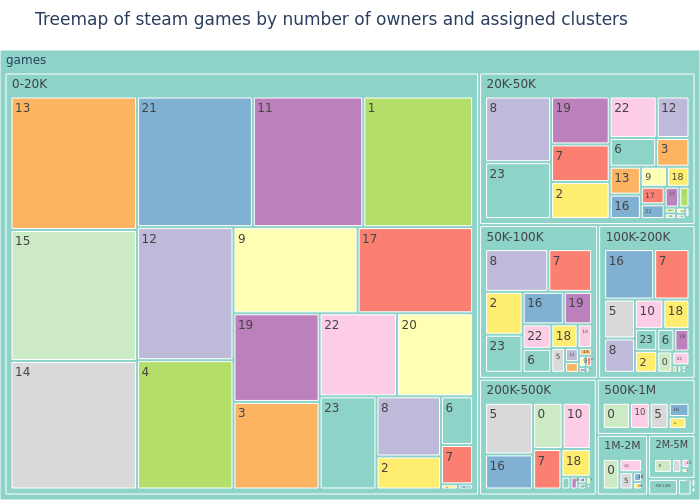

In [6]:
from IPython.core.display import Image
Image(fig.to_image(format="png"))

## Treemap of steam games by assigned clusters and number of owners

We see that the majority of clusters look quite homogeneous with respect to number of owners.

**Interactive** (does not show in GitHub notebook preview)

In [7]:
import plotly.express as px
viz = kaggle_steam.copy().loc[:,['cluster', 'owners']]
viz['owners'] = viz['owners'].str.split('-')
viz['lo'] = viz['owners'].map(lambda x: shorten(int(x[0])))
viz['hi'] = viz['owners'].map(lambda x: shorten(int(x[1])))
viz['owners'] = viz['lo'] + '-' + viz['hi']
viz = viz.groupby(['cluster', 'owners']).count().iloc[:, 0].rename('count').reset_index()
viz['cluster'] = viz['cluster'].map(str)

fig = px.treemap(viz, 
                 path=[px.Constant("games"), 'cluster', 'owners'], 
                 values='count', 
                 color='owners', 
                 color_discrete_sequence=list(sb.palettes.color_palette('Set2').as_hex()),
                 title='Treemap of steam games by assigned clusters and number of owners')
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=0, r=0, b=0))

**Non-interactive**

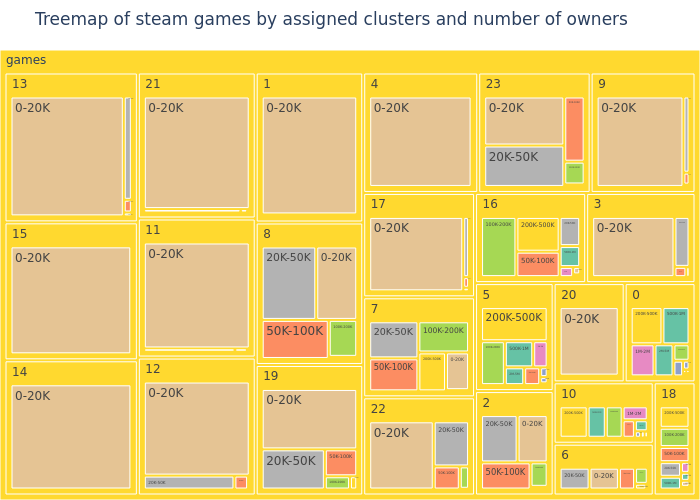

In [8]:
from IPython.core.display import Image
Image(fig.to_image(format="png"))

In [11]:
clusters_4: pd.Series = catalog.load(f'labels@kprototypes@{4}')['cluster'].set_axis(X.index)

[04/20/23 21:18:33] INFO     Loading data from 'labels@kprototypes@4' (CSVDataSet)...           ]8;id=483237;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py\data_catalog.py]8;;\:]8;id=170180;file:///home/eckt/.local/share/virtualenvs/usg-8_lb1q9f/lib/python3.8/site-packages/kedro/io/data_catalog.py#343\343]8;;\

<Axes: xlabel='None-cluster4', ylabel='cluster'>

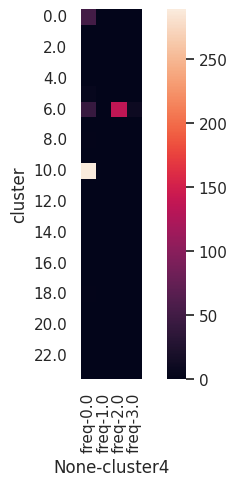

In [25]:
viz = pd.concat([clusters_4.rename('cluster4'), pd.Series([1] * len(clusters), name="freq")], axis=1).groupby(['cluster4', 'cluster']).sum().unstack("cluster4").fillna(0).astype(np.int64)
sb.heatmap(viz,square=True)

[Text(0.5, 1.0, 'k=4 distribution in k=24')]

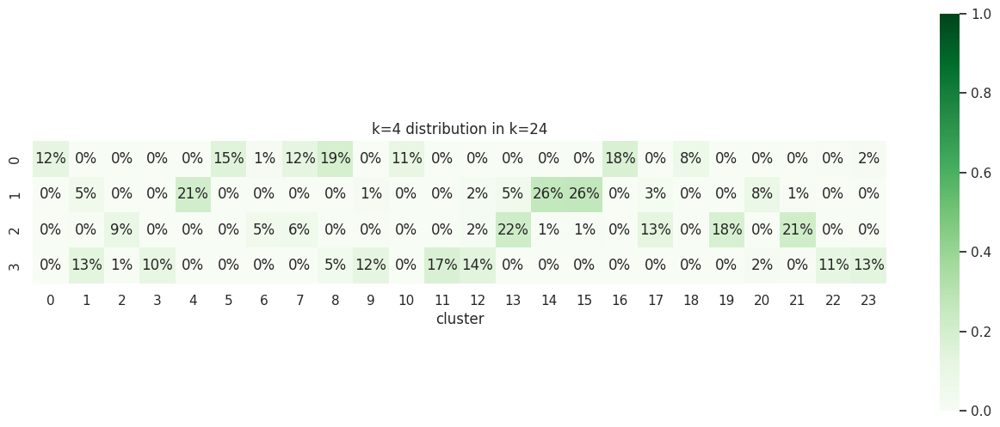

In [141]:
viz = (
    pd.concat([
        clusters_4.rename('cluster4'), 
        clusters, 
        pd.Series([1] * len(clusters), name="freq").set_axis(X.index)
    ], 
    axis=1)
    .groupby(['cluster4', 'cluster'])
    .sum()
    .reset_index()
    .pivot(index="cluster", columns="cluster4", values="freq")
    .fillna(0)
    .astype(np.int64)
    )
viz = (viz / clusters_4.value_counts())
plt.figure(figsize=(16,6))
sb.heatmap(viz.T, square=True, vmin=0, vmax=1,cmap="Greens", annot=True, fmt=".0%").set(title="k=4 distribution in k=24")

In [142]:
import plotly.graph_objects as go
viz = (
    pd.concat([
        clusters_4.rename('cluster4'), 
        clusters, 
        pd.Series([1] * len(clusters), name="freq").set_axis(X.index)
    ], 
    axis=1)
    .groupby(['cluster4', 'cluster'])
    .sum()
    .reset_index()
    )

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = list(range(0,4)) + list(range(0,k)),
      color = "blue"
    ),
    link = dict(
      source = viz["cluster4"], # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = viz["cluster"] + 4,
      value = viz["freq"]
  ))])

fig.update_layout(title_text="k=4 distribution in k=24", font_size=10, height=1024)
fig.show()

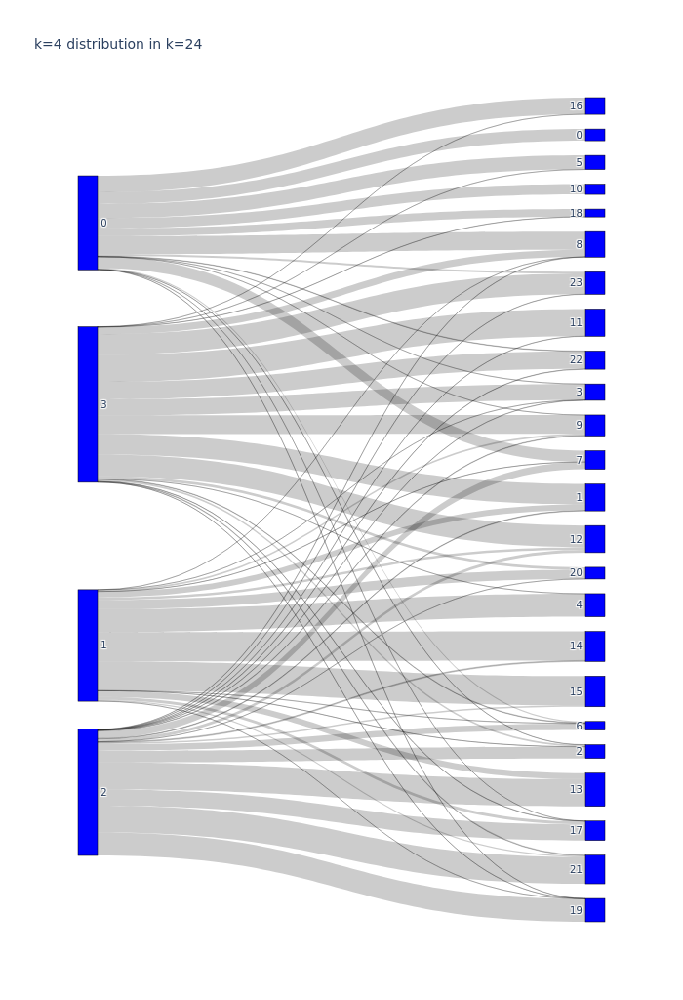

In [143]:
from IPython.core.display import Image
Image(fig.to_image(format="png"))